In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi


Thu Jun 13 04:28:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!git clone https://github.com/openai/CLIP.git

Cloning into 'CLIP'...
remote: Enumerating objects: 256, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 256 (delta 6), reused 4 (delta 0), pack-reused 243
Receiving objects: 100% (256/256), 8.93 MiB | 15.18 MiB/s, done.
Resolving deltas: 100% (130/130), done.


In [ ]:
!git clone https://github.com/CompVis/taming-transformers



Cloning into 'taming-transformers'...
remote: Enumerating objects: 1342, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 1342 (delta 0), reused 1 (delta 0), pack-reused 1340
Receiving objects: 100% (1342/1342), 409.77 MiB | 14.44 MiB/s, done.
Resolving deltas: 100% (282/282), done.


# installing some labraries



In [ ]:
!pip install --no-deps ftfy regex tqdm
!pip install omegaconf==2.0.0 pytorch-lightning==1.0.8
!pip uninstall torchtext --yes
!pip install einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 561.4/561.4 kB 20.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manyli

In [ ]:
# import IMAGE, NUMPY,PANDAS,MATPLTOLIB libraries
import PIL
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# import PYTORCH libraries
import torch, os, imageio, pdb, math
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF

In [ ]:
import yaml
from omegaconf import OmegaConf
from CLIP import clip
import warnings
warnings.filterwarnings('ignore')

In [ ]:
## helper functions
def show_from_tensor(tensor):
  img = tensor.clone()
  img = img.mul(255).byte()
  img = img.cpu().numpy().transpose((1,2,0))

  plt.figure(figsize=(10,7))
  plt.axis('off')
  plt.imshow(img)
  plt.show()

def norm_data(data):
  return (data.clip(-1,1)+1)/2 ### range between 0 and 1 in the result
### Parameters
learning_rate = .5
batch_size = 1
wd = .1
noise_factor = .22
total_iter=400
im_shape = [450, 450, 3] # height, width, channel
size1, size2, channels = im_shape

In [ ]:
### CLIP MODEL ###
clipmodel, _ = clip.load('ViT-B/32', jit=False)
clipmodel.eval()
print(clip.available_models())


print("Clip model visual input resolution: ", clipmodel.visual.input_resolution)

device=torch.device("cuda:0")
torch.cuda.empty_cache()

100%|███████████████████████████████████████| 338M/338M [00:08<00:00, 39.8MiB/s]


['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']
Clip model visual input resolution:  224


In [ ]:
%cd taming-transformers/

!mkdir -p models/vqgan_imagenet_f16_16384/checkpoints
!mkdir -p models/vqgan_imagenet_f16_16384/configs

if len(os.listdir('models/vqgan_imagenet_f16_16384/checkpoints/')) == 0:

  !wget 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1' -O 'models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt'
  !wget 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1' -O 'models/vqgan_imagenet_f16_16384/configs/model.yaml'

/content/taming-transformers
--2024-06-13 04:40:08--  https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1
Resolving heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)... 129.206.7.113
Connecting to heibox.uni-heidelberg.de (heibox.uni-heidelberg.de)|129.206.7.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://heibox.uni-heidelberg.de/seafhttp/files/beac6a24-c848-4602-b09c-b7482c86ef13/last.ckpt [following]
--2024-06-13 04:40:09--  https://heibox.uni-heidelberg.de/seafhttp/files/beac6a24-c848-4602-b09c-b7482c86ef13/last.ckpt
Reusing existing connection to heibox.uni-heidelberg.de:443.
HTTP request sent, awaiting response... 200 OK
Length: 980092370 (935M) [application/octet-stream]
Saving to: ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’

models/vqgan_imagen 100%[===================>] 934.69M  7.70MB/s    in 2m 5s   

2024-06-13 04:42:14 (7.48 MB/s) - ‘models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt’ saved [980092370/980

In [ ]:
from taming.models.vqgan import VQModel

def load_config(config_path, display=False):
   config_data = OmegaConf.load(config_path)
   if display:
     print(yaml.dump(OmegaConf.to_container(config_data)))
   return config_data

def load_vqgan(config, chk_path=None):
  model = VQModel(**config.model.params)
  if chk_path is not None:
    state_dict = torch.load(chk_path, map_location="cpu")["state_dict"]
    missing, unexpected = model.load_state_dict(state_dict, strict=False)
  return model.eval()

def generator(x):
  x = taming_model.post_quant_conv(x)
  x = taming_model.decoder(x)
  return x

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache() # Only relevant if using a GPU

taming_config = load_config("./models/vqgan_imagenet_f16_16384/configs/model.yaml", display=True)
taming_model = load_vqgan(taming_config, chk_path="./models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(device)



model:
  base_learning_rate: 4.5e-06
  params:
    ddconfig:
      attn_resolutions:
      - 16
      ch: 128
      ch_mult:
      - 1
      - 1
      - 2
      - 2
      - 4
      double_z: false
      dropout: 0.0
      in_channels: 3
      num_res_blocks: 2
      out_ch: 3
      resolution: 256
      z_channels: 256
    embed_dim: 256
    lossconfig:
      params:
        codebook_weight: 1.0
        disc_conditional: false
        disc_in_channels: 3
        disc_num_layers: 2
        disc_start: 0
        disc_weight: 0.75
      target: taming.modules.losses.vqperceptual.VQLPIPSWithDiscriminator
    monitor: val/rec_loss
    n_embed: 16384
  target: taming.models.vqgan.VQModel

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 130MB/s]


8.19kB [00:00, 315kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


In [ ]:
### Declare the values that we are going to optimize

class Parameters(torch.nn.Module):
  def __init__(self):
    super(Parameters, self).__init__()
    self.data = .5*torch.randn(batch_size, 256, size1//16, size2//16).cuda() # 1x256x14x15 (225/16, 400/16)
    self.data = torch.nn.Parameter(torch.sin(self.data))

  def forward(self):
    return self.data

def init_params():
  params=Parameters().cuda()
  optimizer = torch.optim.AdamW([{'params':[params.data], 'lr': learning_rate}], weight_decay=wd)
  return params, optimizer


torch.Size([1, 256, 28, 28])
img dimensions:  torch.Size([1, 3, 448, 448])


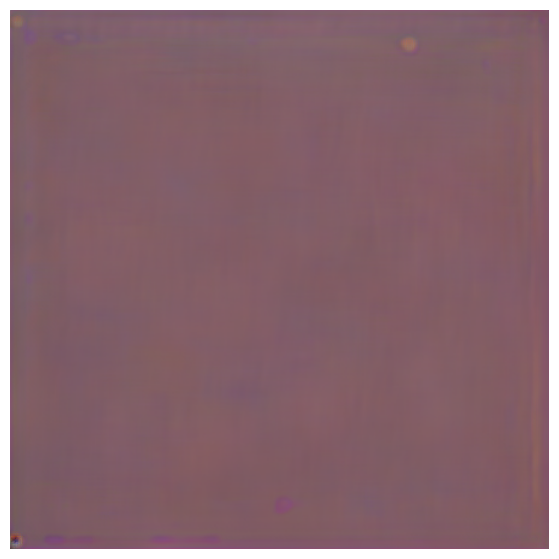

In [ ]:
### Encoding prompts and a few more things
normalize = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))

def encodeText(text):
  t=clip.tokenize(text).cuda()
  t=clipmodel.encode_text(t).detach().clone()
  return t

def createEncodings(include, exclude, extras):
  include_enc=[]
  for text in include:
    include_enc.append(encodeText(text))
  exclude_enc=encodeText(exclude) if exclude != '' else 0
  extras_enc=encodeText(extras) if extras !='' else 0

  return include_enc, exclude_enc, extras_enc

augTransform = torch.nn.Sequential(
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomAffine(30, (.2, .2), fill=0)
).cuda()

Params, optimizer = init_params()

with torch.no_grad():
  print(Params().shape)
  img= norm_data(generator(Params()).cpu()) # 1 x 3 x 224 x 400 [225 x 400]
  print("img dimensions: ",img.shape)
  show_from_tensor(img[0])

In [ ]:
### create crops
def create_crops(img, num_crops=32):
    p=size1//2
    img = torch.nn.functional.pad(img, (p,p,p,p), mode='constant', value=0) # 1
    img = augTransform(img) #RandomHorizontalFlip and RandomAffine
    crop_set = []
    for ch in range(num_crops):
        gap1= int(torch.normal(1.2, .3, ()).clip(.43, 1.9) * size1)
        offsetx = torch.randint(0, int(size1*2-gap1),())
        offsety = torch.randint(0, int(size1*2-gap1),()) #This line was not indented properly
        crop=img[:,:,offsetx:offsetx+gap1, offsety:offsety+gap1]
        crop = torch.nn.functional.interpolate(crop,(224,224), mode='bilinear', align_corners=True)
        crop_set.append(crop)
        img_crops=torch.cat(crop_set,0) ## 30 x 3 x 224 x 224
    randnormal = torch.randn_like(img_crops, requires_grad=False) #This line was not indented properly
    num_rands=0
    randstotal=torch.rand((img_crops.shape[0],1,1,1)).cuda() #32
    for ns in range(num_rands):
        randstotal*=torch.rand((img_crops.shape[0],1,1,1)).cuda()
    img_crops = img_crops + noise_factor*randstotal*randnormal
    return img_crops

In [ ]:
### Show current state of generation
def showme(Params, show_crop):
  with torch.no_grad(): # Indent this block under the function definition
    generated = generator(Params())
    if (show_crop):
      print("Augmented cropped example")
      aug_gen = generated.float() # 1 x 3 x 224 x 400
      aug_gen = create_crops(aug_gen, num_crops=1)
      aug_gen_norm = norm_data(aug_gen[0])
      show_from_tensor(aug_gen_norm)
    print("Generation")
    latest_gen=norm_data(generated.cpu()) # 1 x 3 x 224 x 400
    show_from_tensor(latest_gen[0])
    return (latest_gen[0])

In [ ]:
### Optimization process
def optimize_result(Params, prompt):
    alpha=1 ## the importance of the include encodings
    beta=.5 ## the importance of the exclude encodings
    ## image encoding
    out = generator(Params())
    out = norm_data(out)
    out = create_crops(out)
    out = normalize(out) # 30 x 3 x 224 x 224
    image_enc=clipmodel.encode_image(out) ## 30 x 512
    ## text encoding w1 and w2
    final_enc = w1*prompt + w1*extras_enc # prompt and extras_enc : 1 x 512
    final_text_include_enc = final_enc / final_enc.norm(dim=-1, keepdim=True) #
    final_text_exclude_enc = exclude_enc
    ## calculate the loss
    main_loss = torch.cosine_similarity(final_text_include_enc, image_enc, -1)
    penalize_loss = torch.cosine_similarity(final_text_exclude_enc, image_enc, -1) # Add missing argument here
    final_loss = -alpha*main_loss + beta*penalize_loss
    return final_loss

def optimize(Params, optimizer, prompt):
    loss = optimize_result(Params, prompt).mean()
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    return loss

In [ ]:
### training loop
def training_loop(Params, optimizer, show_crop=False):
    res_img=[] # Indent this line
    res_z=[] # Indent this line
    for prompt in include_enc: # Indent this line
        iteration=0 # Indent this line
        Params, optimizer = init_params() # 1 x 256 x 14 x 25 (225/16, 400/16) # Indent this line
        for it in range(total_iter): # Indent this line
            loss = optimize(Params, optimizer, prompt) # Indent this line
            if iteration>=80 and iteration%show_step == 0: # Indent this line
                new_img = showme(Params, show_crop) # Indent this line
                res_img.append(new_img) # Indent this line
                res_z.append(Params()) # 1 x 256 x 14 x 25 # Indent this line
            print("loss:", loss.item(), "\niteration:",iteration) # Indent this line
            iteration+=1 # Indent this line
        torch.cuda.empty_cache() # Indent this line
    return res_img, res_z # Indent this line


loss: -0.045135498046875 
iteration: 0
loss: -0.05023193359375 
iteration: 1
loss: -0.07733154296875 
iteration: 2
loss: -0.0980224609375 
iteration: 3
loss: -0.11444091796875 
iteration: 4
loss: -0.1336669921875 
iteration: 5
loss: -0.149658203125 
iteration: 6
loss: -0.139892578125 
iteration: 7
loss: -0.1717529296875 
iteration: 8
loss: -0.180419921875 
iteration: 9
loss: -0.1861572265625 
iteration: 10
loss: -0.18798828125 
iteration: 11
loss: -0.177490234375 
iteration: 12
loss: -0.188232421875 
iteration: 13
loss: -0.1727294921875 
iteration: 14
loss: -0.19140625 
iteration: 15
loss: -0.207763671875 
iteration: 16
loss: -0.177490234375 
iteration: 17
loss: -0.1744384765625 
iteration: 18
loss: -0.1890869140625 
iteration: 19
loss: -0.195556640625 
iteration: 20
loss: -0.2076416015625 
iteration: 21
loss: -0.1982421875 
iteration: 22
loss: -0.205810546875 
iteration: 23
loss: -0.18017578125 
iteration: 24
loss: -0.2130126953125 
iteration: 25
loss: -0.220458984375 
iteration: 26
l

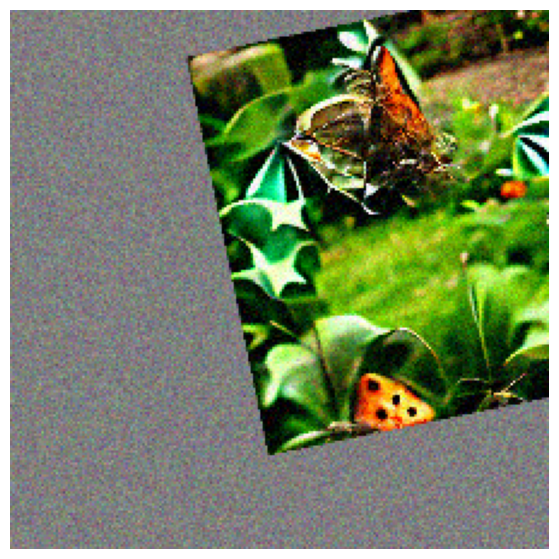

Generation


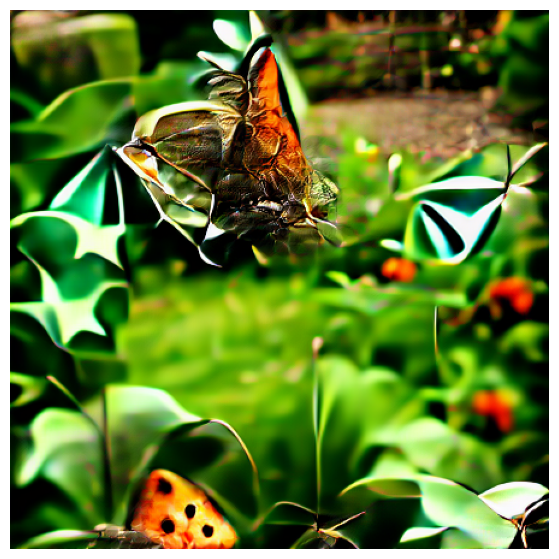

loss: -0.2548828125 
iteration: 80
loss: -0.248291015625 
iteration: 81
loss: -0.2440185546875 
iteration: 82
loss: -0.2216796875 
iteration: 83
loss: -0.24365234375 
iteration: 84
loss: -0.248291015625 
iteration: 85
loss: -0.24267578125 
iteration: 86
loss: -0.248779296875 
iteration: 87
loss: -0.260498046875 
iteration: 88
loss: -0.2451171875 
iteration: 89
Augmented cropped example


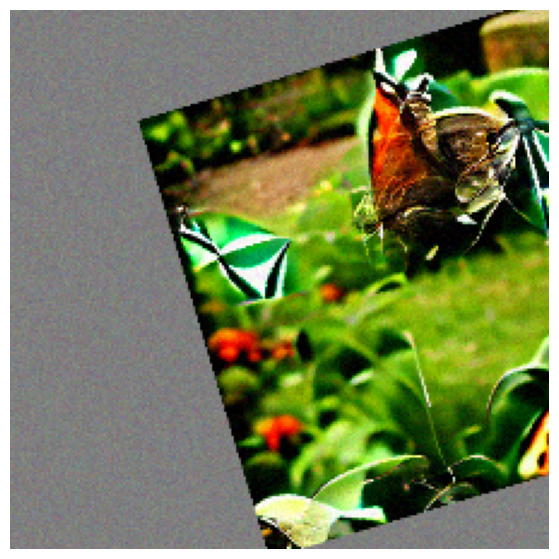

Generation


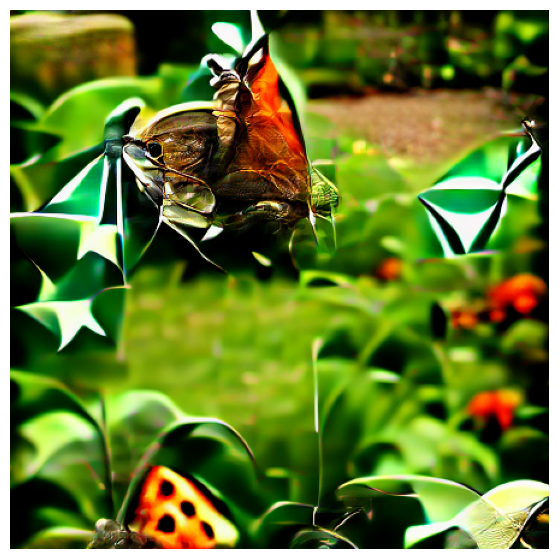

loss: -0.258544921875 
iteration: 90
loss: -0.263427734375 
iteration: 91
loss: -0.25634765625 
iteration: 92
loss: -0.259521484375 
iteration: 93
loss: -0.2479248046875 
iteration: 94
loss: -0.26318359375 
iteration: 95
loss: -0.26953125 
iteration: 96
loss: -0.265380859375 
iteration: 97
loss: -0.25634765625 
iteration: 98
loss: -0.269775390625 
iteration: 99
Augmented cropped example


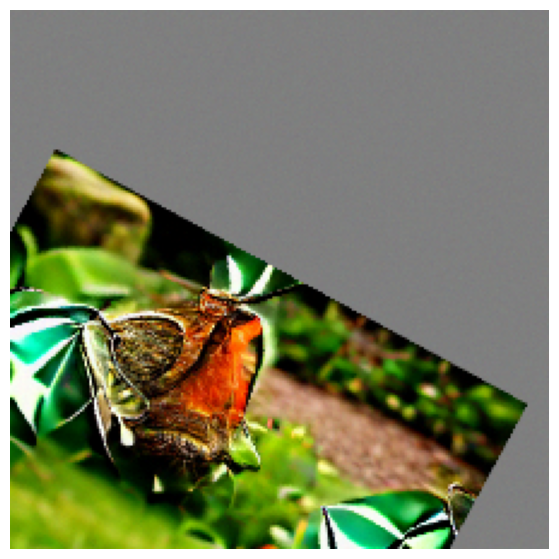

Generation


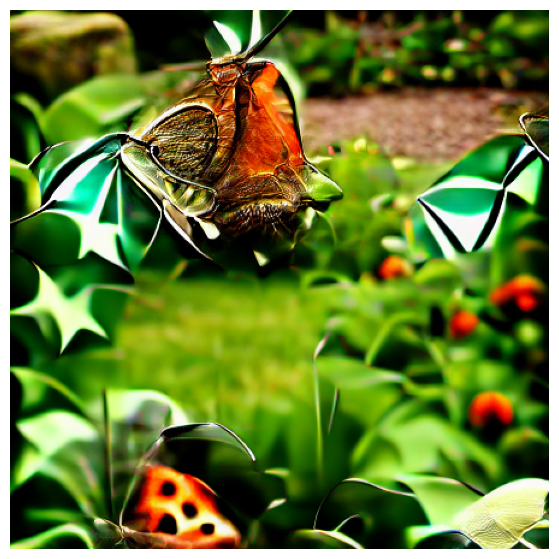

loss: -0.2469482421875 
iteration: 100
loss: -0.249755859375 
iteration: 101
loss: -0.260498046875 
iteration: 102
loss: -0.2705078125 
iteration: 103
loss: -0.26123046875 
iteration: 104
loss: -0.252685546875 
iteration: 105
loss: -0.248046875 
iteration: 106
loss: -0.240478515625 
iteration: 107
loss: -0.249755859375 
iteration: 108
loss: -0.252197265625 
iteration: 109
loss: -0.07818603515625 
iteration: 0
loss: -0.0775146484375 
iteration: 1
loss: -0.07989501953125 
iteration: 2
loss: -0.08197021484375 
iteration: 3
loss: -0.09912109375 
iteration: 4
loss: -0.1131591796875 
iteration: 5
loss: -0.121337890625 
iteration: 6
loss: -0.1270751953125 
iteration: 7
loss: -0.130859375 
iteration: 8
loss: -0.1319580078125 
iteration: 9
loss: -0.1353759765625 
iteration: 10
loss: -0.1416015625 
iteration: 11
loss: -0.1478271484375 
iteration: 12
loss: -0.144775390625 
iteration: 13
loss: -0.158447265625 
iteration: 14
loss: -0.1636962890625 
iteration: 15
loss: -0.1546630859375 
iteration: 1

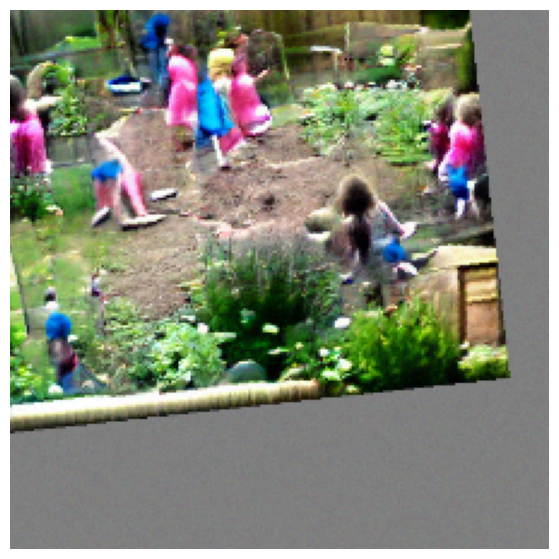

Generation


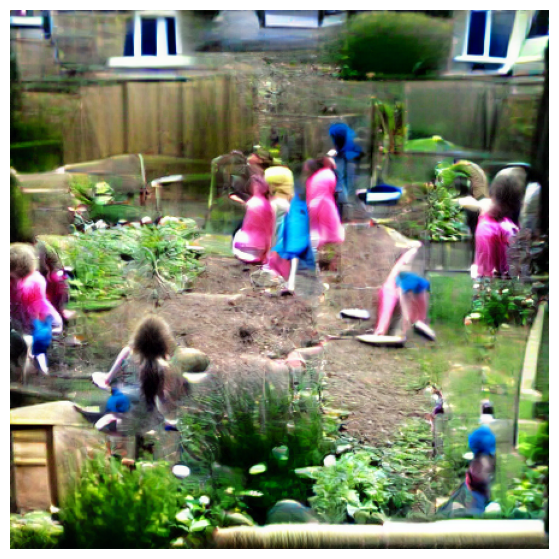

loss: -0.253662109375 
iteration: 80
loss: -0.265380859375 
iteration: 81
loss: -0.273681640625 
iteration: 82
loss: -0.2432861328125 
iteration: 83
loss: -0.2548828125 
iteration: 84
loss: -0.265869140625 
iteration: 85
loss: -0.2366943359375 
iteration: 86
loss: -0.259765625 
iteration: 87
loss: -0.2464599609375 
iteration: 88
loss: -0.26806640625 
iteration: 89
Augmented cropped example


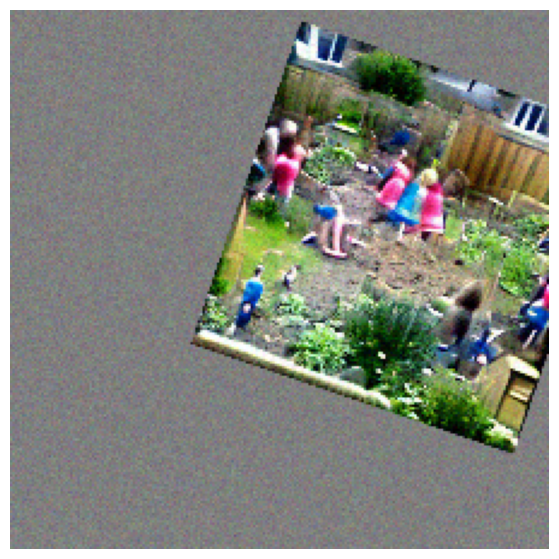

Generation


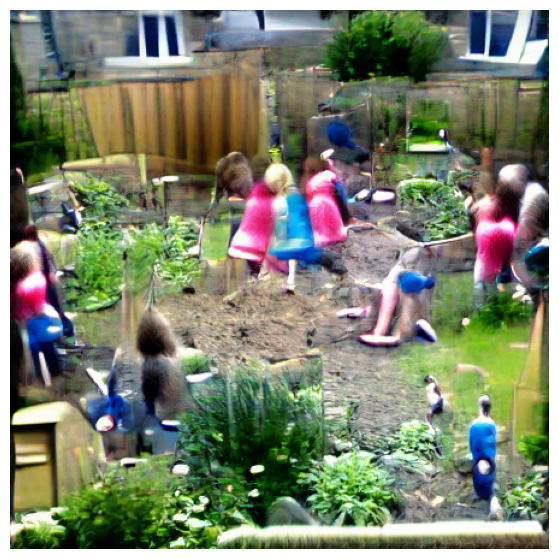

loss: -0.265380859375 
iteration: 90
loss: -0.22998046875 
iteration: 91
loss: -0.25048828125 
iteration: 92
loss: -0.250244140625 
iteration: 93
loss: -0.2418212890625 
iteration: 94
loss: -0.26953125 
iteration: 95
loss: -0.272705078125 
iteration: 96
loss: -0.251220703125 
iteration: 97
loss: -0.265869140625 
iteration: 98
loss: -0.255859375 
iteration: 99
Augmented cropped example


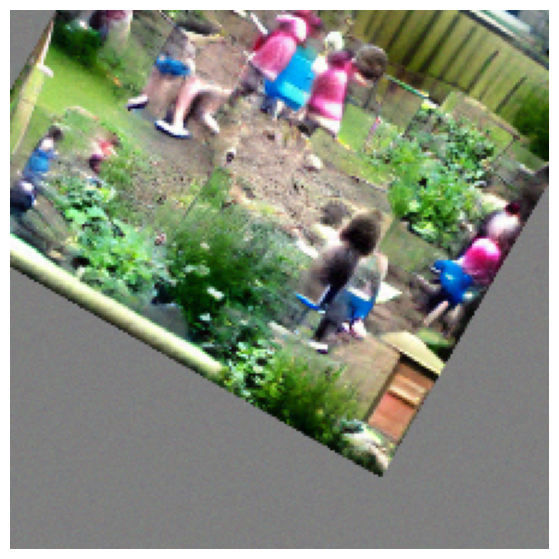

Generation


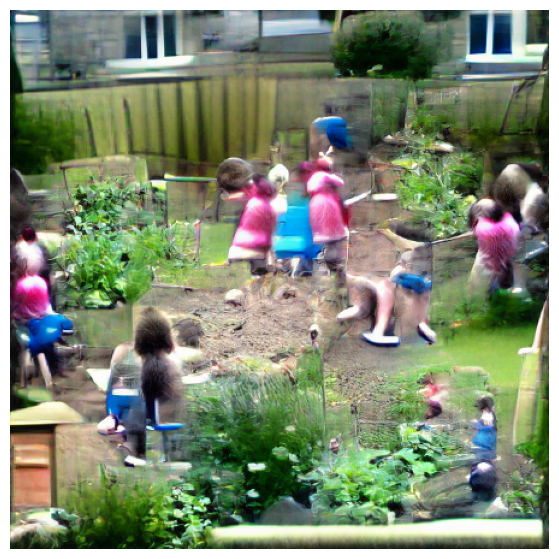

loss: -0.266357421875 
iteration: 100
loss: -0.2548828125 
iteration: 101
loss: -0.26806640625 
iteration: 102
loss: -0.255615234375 
iteration: 103
loss: -0.270751953125 
iteration: 104
loss: -0.27587890625 
iteration: 105
loss: -0.2427978515625 
iteration: 106
loss: -0.26171875 
iteration: 107
loss: -0.2427978515625 
iteration: 108
loss: -0.255615234375 
iteration: 109


In [ ]:
torch.cuda.empty_cache()
#include=['sketch of a lady', 'sketch of a man on a horse']
include=['butterfly in the green garden','childrens are plaing in the garden']
exclude='watermark'
extras = ""
w1=1
w2=1
noise_factor= .22
total_iter = 110
show_step = 10  # set this to see the result every 10 interations beyond iteration
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)
res_img, res_z = training_loop(Params, optimizer, show_crop=True)

loss: -0.07904052734375 
iteration: 0
loss: -0.07830810546875 
iteration: 1
loss: -0.081787109375 
iteration: 2
loss: -0.09271240234375 
iteration: 3
loss: -0.097900390625 
iteration: 4
loss: -0.10302734375 
iteration: 5
loss: -0.10888671875 
iteration: 6
loss: -0.1080322265625 
iteration: 7
loss: -0.12286376953125 
iteration: 8
loss: -0.126708984375 
iteration: 9
loss: -0.131103515625 
iteration: 10
loss: -0.14697265625 
iteration: 11
loss: -0.1527099609375 
iteration: 12
loss: -0.1619873046875 
iteration: 13
loss: -0.1622314453125 
iteration: 14
loss: -0.194091796875 
iteration: 15
loss: -0.1761474609375 
iteration: 16
loss: -0.1849365234375 
iteration: 17
loss: -0.1971435546875 
iteration: 18
loss: -0.183349609375 
iteration: 19
loss: -0.1959228515625 
iteration: 20
loss: -0.221923828125 
iteration: 21
loss: -0.2161865234375 
iteration: 22
loss: -0.208984375 
iteration: 23
loss: -0.200927734375 
iteration: 24
loss: -0.2442626953125 
iteration: 25
loss: -0.2117919921875 
iteration: 2

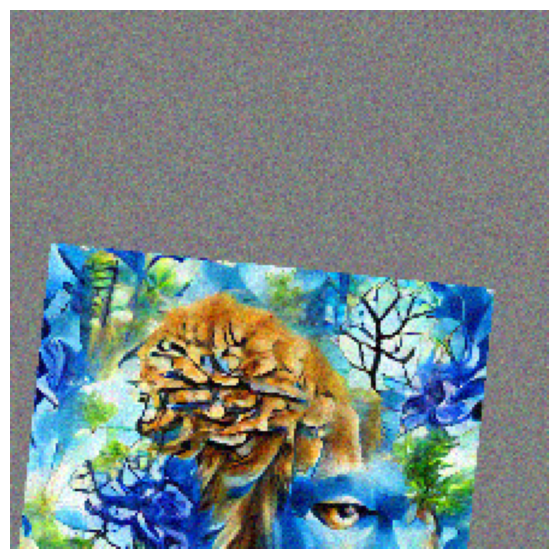

Generation


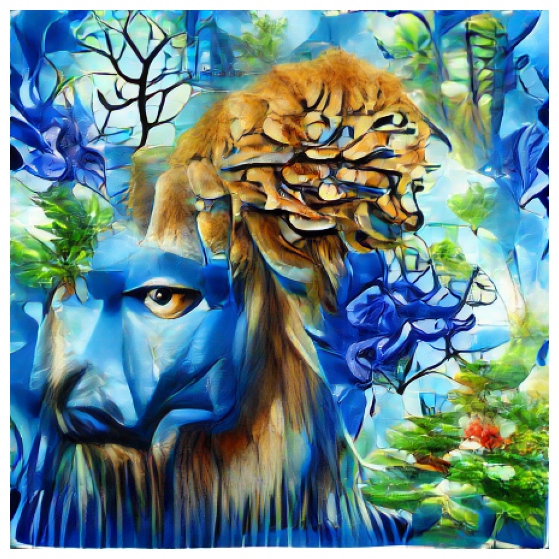

loss: -0.293212890625 
iteration: 80
loss: -0.283447265625 
iteration: 81
loss: -0.296875 
iteration: 82
loss: -0.297119140625 
iteration: 83
loss: -0.299072265625 
iteration: 84
loss: -0.26611328125 
iteration: 85
loss: -0.293212890625 
iteration: 86
loss: -0.2890625 
iteration: 87
loss: -0.2763671875 
iteration: 88
loss: -0.294677734375 
iteration: 89
Augmented cropped example


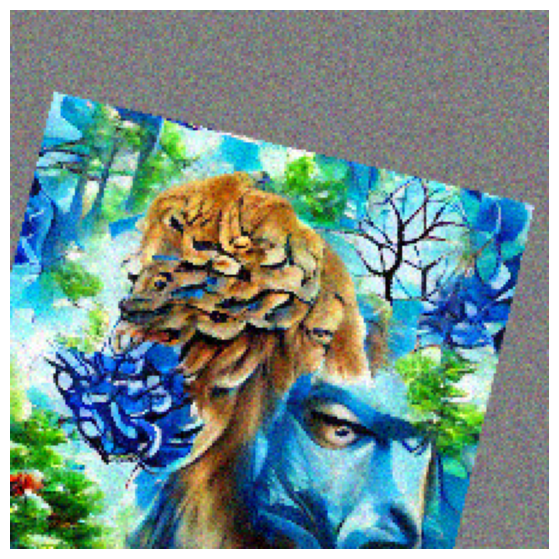

Generation


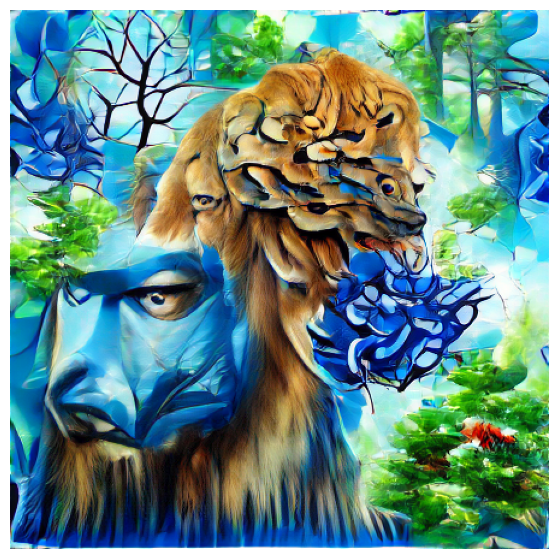

loss: -0.259765625 
iteration: 90
loss: -0.296630859375 
iteration: 91
loss: -0.30224609375 
iteration: 92
loss: -0.291259765625 
iteration: 93
loss: -0.274169921875 
iteration: 94
loss: -0.29296875 
iteration: 95
loss: -0.30224609375 
iteration: 96
loss: -0.284423828125 
iteration: 97
loss: -0.282958984375 
iteration: 98
loss: -0.295166015625 
iteration: 99
Augmented cropped example


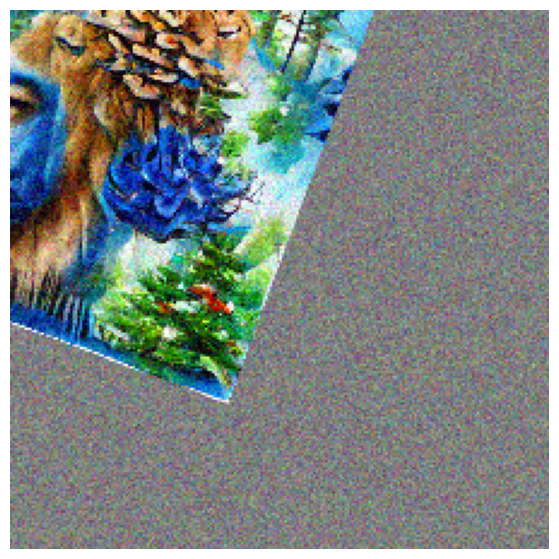

Generation


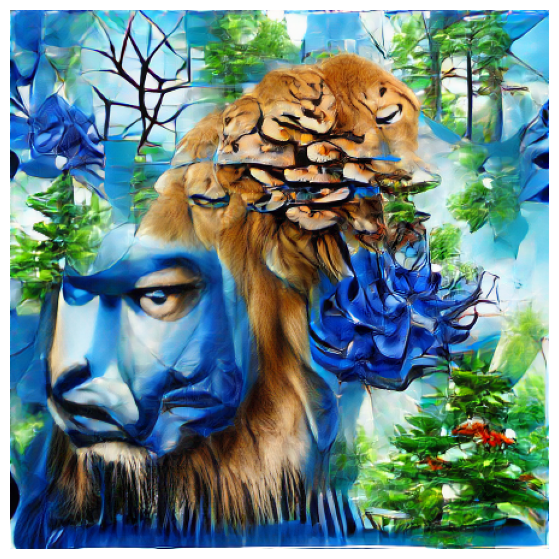

loss: -0.288330078125 
iteration: 100
loss: -0.271240234375 
iteration: 101
loss: -0.260986328125 
iteration: 102
loss: -0.285888671875 
iteration: 103
loss: -0.313232421875 
iteration: 104
loss: -0.28125 
iteration: 105
loss: -0.292236328125 
iteration: 106
loss: -0.29296875 
iteration: 107
loss: -0.294921875 
iteration: 108
loss: -0.311279296875 
iteration: 109
loss: -0.1036376953125 
iteration: 0
loss: -0.1046142578125 
iteration: 1
loss: -0.11383056640625 
iteration: 2
loss: -0.1298828125 
iteration: 3
loss: -0.14697265625 
iteration: 4
loss: -0.1485595703125 
iteration: 5
loss: -0.15966796875 
iteration: 6
loss: -0.1572265625 
iteration: 7
loss: -0.162841796875 
iteration: 8
loss: -0.1796875 
iteration: 9
loss: -0.1744384765625 
iteration: 10
loss: -0.194580078125 
iteration: 11
loss: -0.191162109375 
iteration: 12
loss: -0.2064208984375 
iteration: 13
loss: -0.1856689453125 
iteration: 14
loss: -0.2052001953125 
iteration: 15
loss: -0.230224609375 
iteration: 16
loss: -0.22290039

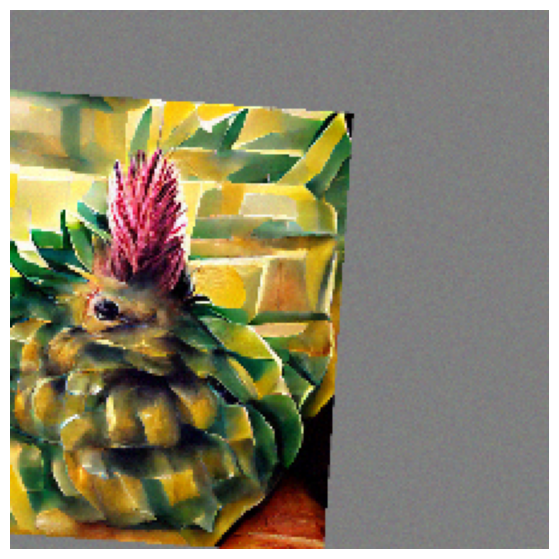

Generation


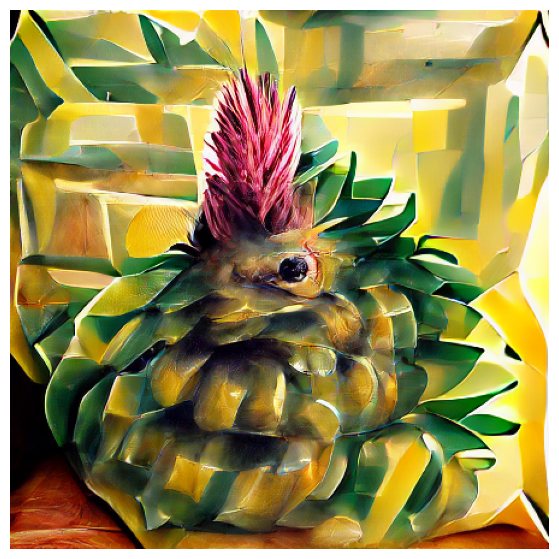

loss: -0.3154296875 
iteration: 80
loss: -0.325927734375 
iteration: 81
loss: -0.30810546875 
iteration: 82
loss: -0.343994140625 
iteration: 83
loss: -0.331787109375 
iteration: 84
loss: -0.320068359375 
iteration: 85
loss: -0.30615234375 
iteration: 86
loss: -0.328369140625 
iteration: 87
loss: -0.3125 
iteration: 88
loss: -0.307861328125 
iteration: 89
Augmented cropped example


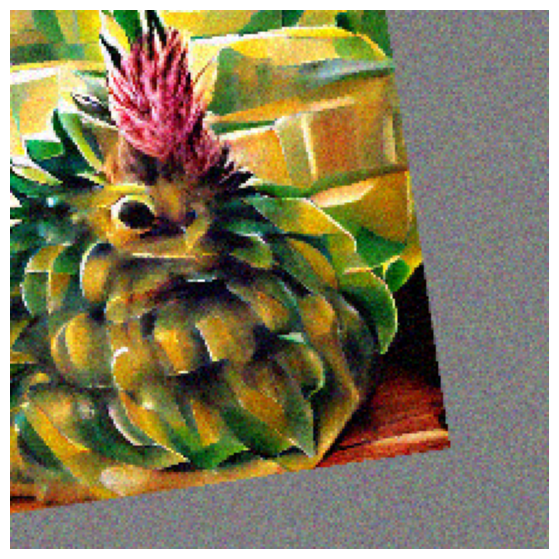

Generation


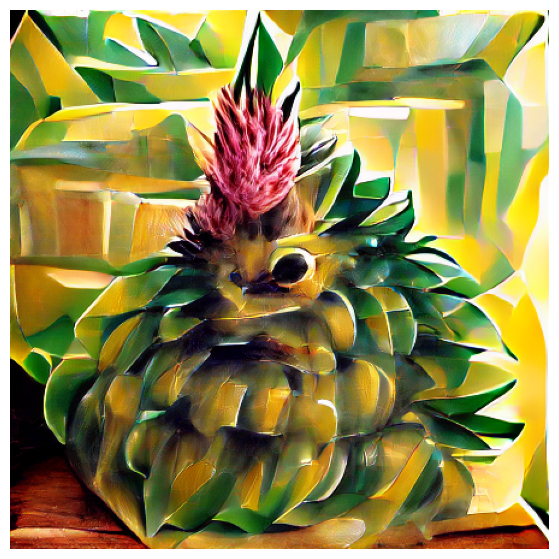

loss: -0.312744140625 
iteration: 90
loss: -0.316650390625 
iteration: 91
loss: -0.30517578125 
iteration: 92
loss: -0.31591796875 
iteration: 93
loss: -0.321533203125 
iteration: 94
loss: -0.323974609375 
iteration: 95
loss: -0.33984375 
iteration: 96
loss: -0.304443359375 
iteration: 97
loss: -0.34521484375 
iteration: 98
loss: -0.2939453125 
iteration: 99
Augmented cropped example


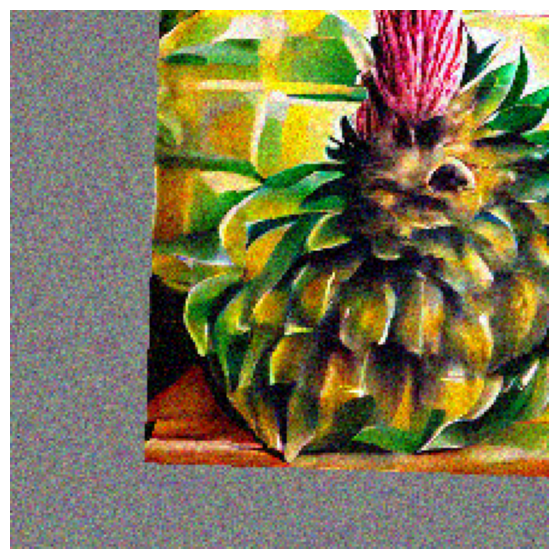

Generation


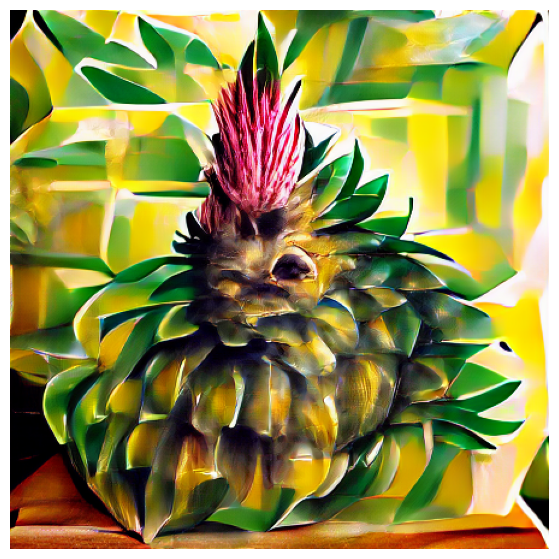

loss: -0.3310546875 
iteration: 100
loss: -0.316162109375 
iteration: 101
loss: -0.311279296875 
iteration: 102
loss: -0.324951171875 
iteration: 103
loss: -0.3349609375 
iteration: 104
loss: -0.3203125 
iteration: 105
loss: -0.319580078125 
iteration: 106
loss: -0.3232421875 
iteration: 107
loss: -0.335205078125 
iteration: 108
loss: -0.337158203125 
iteration: 109


In [ ]:
torch.cuda.empty_cache()
include = ['a forest with blue tree, lion in the forest', 'A painting of a pineapple']
exclude = 'watermark'
exclude += ',childens are playing in the moon,playing cricket in the ground'
extras = ""
w1=1
w2=1
noise_factor= .20
total_iter = 110
show_step = 10  # set this to see the result every 10 iterations beyond iteration
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)
res_img, res_z = training_loop(Params, optimizer, show_crop=True)

In [ ]:
def interpolate(res_z_list, duration_list):
    gen_img_list=[] # Indent this line
    fps = 25 # Indent this line
    for idx, (z, duration) in enumerate(zip(res_z_list, duration_list)): # Indent this line
        num_steps = int(duration*fps) # Indent this line
        z1=z # Indent this line
        z2=res_z_list[(idx+1)%len(res_z_list)] # 1 x 256 x 14 x 25 (225/16, 400/1 # Indent this line
        for step in range(num_steps): # Indent this line
            alpha = math.sin(1.5*step/num_steps)**6 # Indent this line
            z_new = alpha * z2 + (1-alpha) * z1 # Indent this line
            new_gen=norm_data(generator(z_new).cpu())[0] ## 3 x 224 x 400 # Indent this line
            new_img=T.ToPILImage(mode='RGB')(new_gen) # Indent this line
            gen_img_list.append(new_img) # Indent this line
    return gen_img_list # Indent this line

durations=[5,5,5,5,5,5] # This line can stay at this indentation level
interp_result_img_list = interpolate(res_z, durations) # This line can stay at this indentation level

In [ ]:

## create a video
out_video_path=f"../video.mp4"
writer = imageio.get_writer(out_video_path, fps=25)
for pil_img in interp_result_img_list:
    img = np.array(pil_img, dtype=np.uint8) # Indent this line to include it in the loop
    writer.append_data(img) # Indent this line to include it in the loop
writer.close()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('../video.mp4','rb').read()
data="data:video/mp4;base64,"+b64encode(mp4).decode()
HTML("""<video width=800 controls><source src="%s" type="video/mp4"></video>""" % data)